In [11]:
# Import required libraries
import sys
sys.path.append('../src')

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from shapely.geometry import box
import json
from pathlib import Path

# Import project modules
from data_acquisition import fetch_pdok_buildings, PVGISPVCalcClient
from geometry import calculate_roof_area, calculate_roof_orientation, load_solar_data, interpolate_solar_at_point

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

print("✅ Libraries imported successfully!")

✅ Libraries imported successfully!


## 1. Define Study Area

Set the bounding box for the area of interest (e.g., a neighborhood in Utrecht or Enschede)

Study Area: Amsterdam, Netherlands (TEST AREA)
Bounding Box: (4.89, 52.36, 4.91, 52.37)
Center Point: (4.9000, 52.3650)
Approximate Area: 1.52 km²


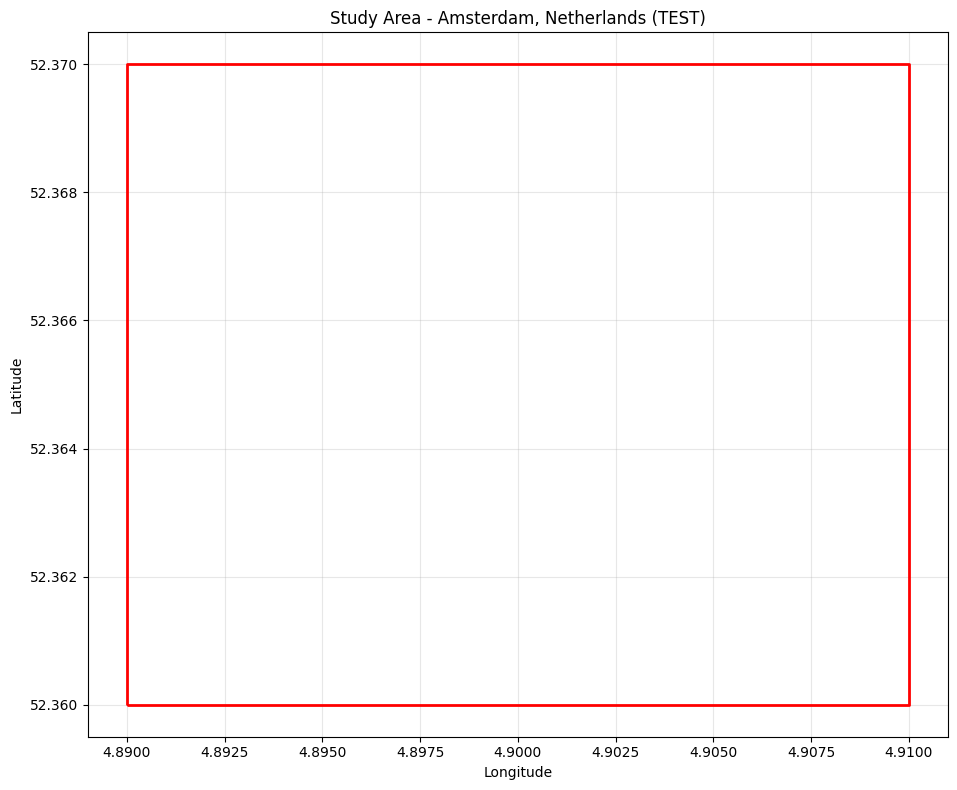


✅ Study area defined!


In [12]:
# Define study area bounding box (Amsterdam - TEST AREA for faster execution)
# Coordinates in WGS84 (longitude, latitude)
study_area_bbox = (4.89, 52.36, 4.91, 52.37)  # (min_lon, min_lat, max_lon, max_lat)

# Create a GeoDataFrame for visualization
bbox_gdf = gpd.GeoDataFrame(
    geometry=[box(*study_area_bbox)], 
    crs="EPSG:4326"
)

# Get center point for solar data
center_lon = (study_area_bbox[0] + study_area_bbox[2]) / 2
center_lat = (study_area_bbox[1] + study_area_bbox[3]) / 2

print(f"Study Area: Amsterdam, Netherlands (TEST AREA)")
print(f"Bounding Box: {study_area_bbox}")
print(f"Center Point: ({center_lon:.4f}, {center_lat:.4f})")
print(f"Approximate Area: {bbox_gdf.to_crs('EPSG:28992').geometry[0].area / 1e6:.2f} km²")

# Visualize the study area
fig, ax = plt.subplots(figsize=(10, 8))
bbox_gdf.boundary.plot(ax=ax, color='red', linewidth=2)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Study Area - Amsterdam, Netherlands (TEST)')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n✅ Study area defined!")

## 2. Fetch Solar Irradiance Data (PVGIS API)

Get solar irradiance data for the study area center point

Loading solar irradiance data...
✅ Solar data file found: ../data/test_solar.json
Loading existing solar data...

📊 Solar Data Summary:
Solar grid points: 15
Average yearly irradiation: 854.58 kWh/m²/year
Min irradiation: 854.53 kWh/m²/year
Max irradiation: 854.64 kWh/m²/year


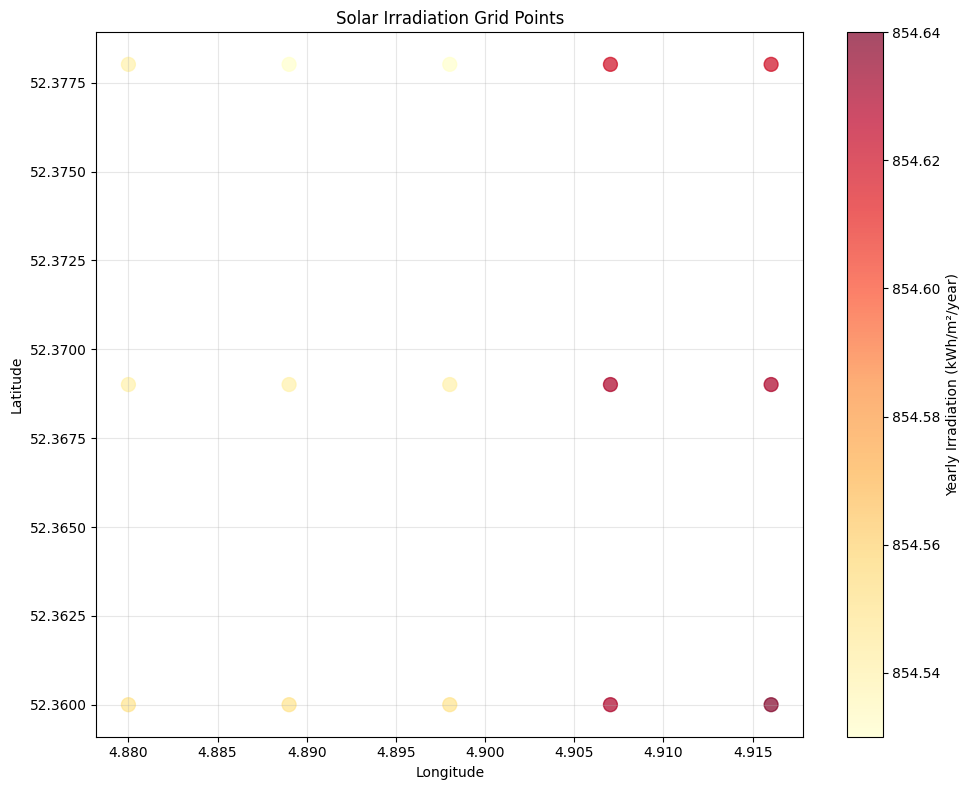

In [13]:
# Load or fetch solar irradiance data for the study area
print("Loading solar irradiance data...")

# Check if test solar data already exists
solar_file = Path("../data/test_solar.json")

if solar_file.exists():
    print(f"✅ Solar data file found: {solar_file}")
    print("Loading existing solar data...")
    
    # Load and display summary
    solar_coords, solar_values = load_solar_data(str(solar_file))
    
    print(f"\n📊 Solar Data Summary:")
    print(f"Solar grid points: {len(solar_values)}")
    print(f"Average yearly irradiation: {solar_values.mean():.2f} kWh/m²/year")
    print(f"Min irradiation: {solar_values.min():.2f} kWh/m²/year")
    print(f"Max irradiation: {solar_values.max():.2f} kWh/m²/year")
    
    # Visualize spatial distribution
    fig, ax = plt.subplots(figsize=(10, 8))
    scatter = ax.scatter(solar_coords[:, 0], solar_coords[:, 1], 
                        c=solar_values, cmap='YlOrRd', s=100, alpha=0.7)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title('Solar Irradiation Grid Points')
    plt.colorbar(scatter, label='Yearly Irradiation (kWh/m²/year)')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
else:
    print(f"\n⚠️ Solar data file not found: {solar_file}")
    print("Fetching solar data from PVGIS API...")
    print("This may take a few minutes...\n")
    
    # Fetch solar data for study area
    client = PVGISPVCalcClient(peakpower=1, loss=14)
    solar_geojson = client.fetch_bbox_geojson(
        bbox=study_area_bbox,
        step_km=1.0,  # 1km grid spacing
        sleep=0.05    # Rate limiting
    )
    
    # Save the data
    client.save_geojson(solar_geojson, str(solar_file))
    print(f"✅ Saved {len(solar_geojson['features'])} solar points to {solar_file}")
    
    # Load it back for analysis
    solar_coords, solar_values = load_solar_data(str(solar_file))
    print(f"Average yearly irradiation: {solar_values.mean():.2f} kWh/m²/year")

## 3. Fetch Building Footprints

TODO: Implement API calls to fetch building footprints from:
- OpenStreetMap (Overpass API)
- Microsoft Building Footprints
- PDOK 3D BAG

In [14]:
# Fetch building footprints from PDOK BAG3D
print("Fetching building footprints from PDOK BAG3D...")
print("This may take a few minutes depending on the area size...\n")

buildings_gdf = fetch_pdok_buildings(
    area=study_area_bbox,
    output_path="../data/test_footprints.json",
    page_size=100
)

print(f"\n✅ Fetched {len(buildings_gdf)} buildings!")
print(f"\nBuilding data columns: {list(buildings_gdf.columns)}")
print(f"\nFirst few buildings:")
print(buildings_gdf.head())

# Basic statistics
print(f"\n📊 Building Statistics:")
print(f"Total buildings: {len(buildings_gdf)}")
if 'b3_h_max' in buildings_gdf.columns:
    print(f"Buildings with height data: {buildings_gdf['b3_h_max'].notna().sum()}")
    print(f"Average building height: {buildings_gdf['b3_h_max'].mean():.2f} m")
    print(f"Max building height: {buildings_gdf['b3_h_max'].max():.2f} m")
else:
    print("⚠️ Height data (b3_h_max) not available in building data")

Fetching building footprints from PDOK BAG3D...
This may take a few minutes depending on the area size...


✅ Fetched 3324 buildings!

Building data columns: ['geometry', 'fid', 'b3_h_50p', 'b3_h_70p', 'b3_h_max', 'b3_h_min', 'b3_dd_id', 'identificatie', 'b3_pand_deel_id', 'b3_bag_bag_overlap', 'b3_n_vlakken', 'b3_pw_onvoldoende', 'b3_t_run', 'b3_h_nok', 'b3_n_nok', 'b3_extrusie', 'b3_is_glas_dak', 'b3_dak_type', 'b3_h_maaiveld', 'b3_kas_warenhuis', 'b3_mutatie_ahn3_ahn4', 'b3_mutatie_ahn4_ahn5', 'b3_nodata_fractie_ahn3', 'b3_nodata_fractie_ahn4', 'b3_nodata_fractie_ahn5', 'b3_nodata_radius_ahn3', 'b3_nodata_radius_ahn4', 'b3_nodata_radius_ahn5', 'b3_opp_buitenmuur', 'b3_opp_dak_plat', 'b3_opp_dak_schuin', 'b3_opp_grond', 'b3_opp_scheidingsmuur', 'b3_puntdichtheid_ahn3', 'b3_puntdichtheid_ahn4', 'b3_puntdichtheid_ahn5', 'b3_pw_bron', 'b3_pw_datum', 'b3_pw_selectie_reden', 'b3_rmse_lod12', 'b3_rmse_lod13', 'b3_rmse_lod22', 'b3_val3dity_lod12', 'b3_val3dity_lod13', 'b3_val3dity_lod22', '

## 4. Calculate Roof Areas

Calculating roof areas...

📊 Roof Area Statistics:
Total roof area: 558.82 thousand m²
Average roof area: 168.12 m²
Median roof area: 79.78 m²
Min roof area: 0.29 m²
Max roof area: 20423.91 m²


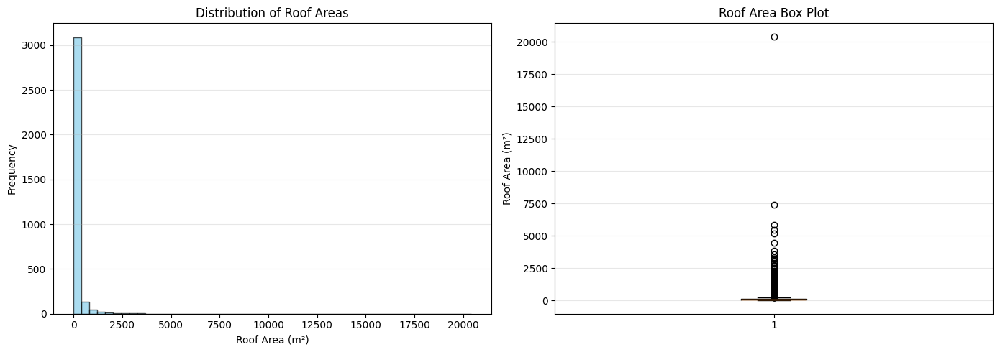


✅ Roof areas calculated!


In [15]:
# Calculate roof areas for all buildings
print("Calculating roof areas...")

buildings_gdf['roof_area'] = buildings_gdf.geometry.apply(calculate_roof_area)

# Statistics
print(f"\n📊 Roof Area Statistics:")
print(f"Total roof area: {buildings_gdf['roof_area'].sum() / 1000:.2f} thousand m²")
print(f"Average roof area: {buildings_gdf['roof_area'].mean():.2f} m²")
print(f"Median roof area: {buildings_gdf['roof_area'].median():.2f} m²")
print(f"Min roof area: {buildings_gdf['roof_area'].min():.2f} m²")
print(f"Max roof area: {buildings_gdf['roof_area'].max():.2f} m²")

# Visualize distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
axes[0].hist(buildings_gdf['roof_area'], bins=50, color='skyblue', edgecolor='black', alpha=0.7)
axes[0].set_xlabel('Roof Area (m²)')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Roof Areas')
axes[0].grid(True, alpha=0.3, axis='y')

# Box plot
axes[1].boxplot(buildings_gdf['roof_area'], vert=True)
axes[1].set_ylabel('Roof Area (m²)')
axes[1].set_title('Roof Area Box Plot')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\n✅ Roof areas calculated!")

## 5. Interpolate Solar Irradiance for Buildings

Use spatial interpolation to estimate solar irradiance at each building location

Interpolating solar irradiance values for buildings...
  Processed 100/3324 buildings...
  Processed 200/3324 buildings...
  Processed 300/3324 buildings...
  Processed 400/3324 buildings...
  Processed 500/3324 buildings...
  Processed 600/3324 buildings...
  Processed 700/3324 buildings...
  Processed 800/3324 buildings...
  Processed 900/3324 buildings...
  Processed 1000/3324 buildings...
  Processed 1100/3324 buildings...
  Processed 1200/3324 buildings...
  Processed 1300/3324 buildings...
  Processed 1400/3324 buildings...
  Processed 1500/3324 buildings...
  Processed 1600/3324 buildings...
  Processed 1700/3324 buildings...
  Processed 1800/3324 buildings...
  Processed 1900/3324 buildings...
  Processed 2000/3324 buildings...
  Processed 2100/3324 buildings...
  Processed 2200/3324 buildings...
  Processed 2300/3324 buildings...
  Processed 2400/3324 buildings...
  Processed 2500/3324 buildings...
  Processed 2600/3324 buildings...
  Processed 2700/3324 buildings...
  Process

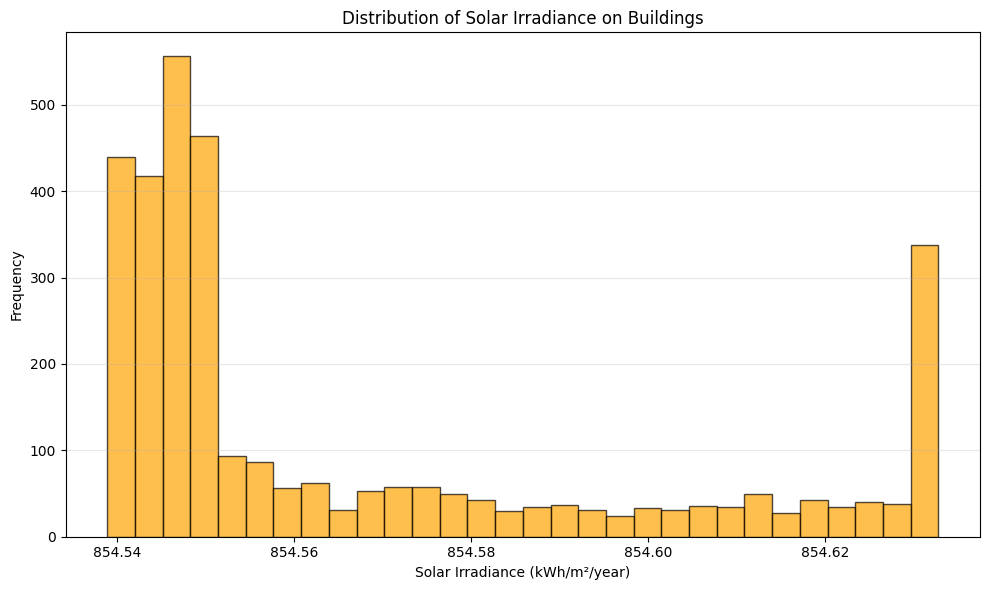


✅ Solar irradiance interpolated for all buildings!


In [18]:
# Interpolate solar irradiance for each building
print("Interpolating solar irradiance values for buildings...")

# Calculate centroids in projected CRS first, then convert to WGS84
building_centroids_projected = buildings_gdf.geometry.centroid
building_centroids_gdf = gpd.GeoDataFrame(geometry=building_centroids_projected, crs=buildings_gdf.crs)
building_centroids_wgs84 = building_centroids_gdf.to_crs('EPSG:4326')

# Interpolate solar values at each building location
solar_irradiance = []
for idx, point in enumerate(building_centroids_wgs84.geometry):
    irradiance = interpolate_solar_at_point(
        point,  # Pass the Point object directly
        solar_coords, 
        solar_values
    )
    solar_irradiance.append(irradiance)
    
    # Progress indicator for every 100 buildings
    if (idx + 1) % 100 == 0:
        print(f"  Processed {idx + 1}/{len(buildings_gdf)} buildings...")

# Add to GeoDataFrame
buildings_gdf['solar_irradiance'] = solar_irradiance

# Statistics
print(f"\n📊 Solar Irradiance Statistics:")
print(f"Average irradiance: {buildings_gdf['solar_irradiance'].mean():.2f} kWh/m²/year")
print(f"Min irradiance: {buildings_gdf['solar_irradiance'].min():.2f} kWh/m²/year")
print(f"Max irradiance: {buildings_gdf['solar_irradiance'].max():.2f} kWh/m²/year")

# Visualize distribution
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(buildings_gdf['solar_irradiance'], bins=30, color='orange', edgecolor='black', alpha=0.7)
ax.set_xlabel('Solar Irradiance (kWh/m²/year)')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Solar Irradiance on Buildings')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

print("\n✅ Solar irradiance interpolated for all buildings!")

## 6. Interactive Map Visualization

In [19]:
# Create interactive map with folium
print("Creating interactive map...")

# Create base map centered on study area
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=15,
    tiles='OpenStreetMap'
)

# Add building footprints to map
folium.GeoJson(
    buildings_gdf.to_crs('EPSG:4326').__geo_interface__,
    name='Buildings',
    style_function=lambda x: {
        'fillColor': 'blue',
        'color': 'darkblue',
        'weight': 1,
        'fillOpacity': 0.4
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['identificatie', 'roof_area', 'b3_h_max', 'solar_irradiance'],
        aliases=['Building ID:', 'Roof Area (m²):', 'Height (m):', 'Solar Irradiance (kWh/m²/year):'],
        localize=True
    )
).add_to(m)

# Add study area boundary
folium.GeoJson(
    bbox_gdf.__geo_interface__,
    name='Study Area',
    style_function=lambda x: {
        'fillColor': 'transparent',
        'color': 'red',
        'weight': 3,
        'dashArray': '5, 5'
    }
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save map
map_path = Path("../outputs/maps/data_exploration_map.html")
map_path.parent.mkdir(parents=True, exist_ok=True)
m.save(str(map_path))

print(f"✅ Interactive map saved to: {map_path}")
print("Open the HTML file in a browser to explore the buildings!")

# Display in notebook (if supported)
m

Creating interactive map...
✅ Interactive map saved to: ../outputs/maps/data_exploration_map.html
Open the HTML file in a browser to explore the buildings!


## 7. Save Data for Further Analysis

In [20]:
# Save processed data for further analysis
print("Saving data for further analysis...")

# Ensure data directory exists
data_dir = Path("../data")
data_dir.mkdir(parents=True, exist_ok=True)

# Save buildings with roof areas
buildings_gdf.to_file(data_dir / "processed_test_buildings.json", driver="GeoJSON")

# Save summary statistics
summary_stats = {
    'study_area': {
        'bbox': study_area_bbox,
        'center': [center_lon, center_lat],
        'area_km2': float(bbox_gdf.to_crs('EPSG:28992').geometry[0].area / 1e6)
    },
    'solar_data': {
        'file': str(solar_file),
        'num_points': int(len(solar_values)),
        'avg_irradiation_kwh_m2_year': float(solar_values.mean()),
        'min_irradiation_kwh_m2_year': float(solar_values.min()),
        'max_irradiation_kwh_m2_year': float(solar_values.max())
    },
    'buildings': {
        'count': int(len(buildings_gdf)),
        'total_roof_area_m2': float(buildings_gdf['roof_area'].sum()),
        'avg_roof_area_m2': float(buildings_gdf['roof_area'].mean()),
        'median_roof_area_m2': float(buildings_gdf['roof_area'].median()),
        'max_roof_area_m2': float(buildings_gdf['roof_area'].max()),
        'min_roof_area_m2': float(buildings_gdf['roof_area'].min())
    }
}

with open(data_dir / "test_exploration_summary.json", 'w') as f:
    json.dump(summary_stats, f, indent=2)

print(f"✅ Data saved successfully!")
print(f"   - Building footprints: {data_dir / 'processed_test_buildings.json'}")
print(f"   - Summary statistics: {data_dir / 'test_exploration_summary.json'}")
print(f"\n📊 Summary:")
print(f"   - {len(buildings_gdf)} buildings processed")
print(f"   - Total roof area: {buildings_gdf['roof_area'].sum() / 1000:.2f} thousand m²")
print(f"\nReady for algorithm development in notebook 02! 🚀")

Saving data for further analysis...
✅ Data saved successfully!
   - Building footprints: ../data/processed_test_buildings.json
   - Summary statistics: ../data/test_exploration_summary.json

📊 Summary:
   - 3324 buildings processed
   - Total roof area: 558.82 thousand m²

Ready for algorithm development in notebook 02! 🚀


## Next Steps

1. ✅ Implement actual API calls in `src/data_acquisition.py`
2. ✅ Fetch real building data from OSM or Microsoft
3. ✅ Add building attributes (height, type) from OSM
4. ✅ Move to notebook 02 for algorithm development